In [4]:
import re
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

from pyspark.sql import *
from pyspark.sql.functions import *
from pyspark.sql.functions import min

from pyspark.sql import SparkSession
from pyspark import SparkContext

import plotly
plotly.offline.init_notebook_mode()

spark = SparkSession.builder.getOrCreate()
sc = spark.sparkContext

**UNHCR**

The database currently contains data about UNHCR's populations of concern from the year 1951 up to 2017 and you can use it to investigate different aspects of these populations: their general composition by location of residence or origin, their status (refugees, asylum seekers, internally displaced persons, etc.), their evolution over time, and so on..
In each of the screens in the system you start by selecting the sub-set of data you are interested in, choosing one or more countries or territories of residence and/or origin. You can focus on specific types of population by checking the boxes for only those you are concerned with, and you can summarize the data by checking the boxes for only those data items by which you wish the data to be broken down.

In [5]:
data = pd.read_json('UNHCR.json')
data.head()

,asy,country_code,country_iso,idp,ioc,ooc,rdp,ref,ret,roc,sta,total,year
0,NaN,AUL,AUS,NaN,0,NaN,NaN,180000.0,NaN,0,NaN,180000,1951
1,NaN,AUS,AUT,NaN,0,NaN,NaN,282000.0,NaN,0,NaN,282000,1951
2,NaN,BEL,BEL,NaN,0,NaN,NaN,55000.0,NaN,0,NaN,55000,1951
3,NaN,CAN,CAN,NaN,0,NaN,NaN,168511.0,NaN,0,NaN,168511,1951
4,NaN,SWI,CHE,NaN,0,NaN,NaN,10000.0,NaN,0,NaN,10000,1951


In [6]:
refugees = data[['country_code', 'country_iso', 'ref', 'year']]
refugees.head()

,country_code,country_iso,ref,year
0,AUL,AUS,180000.0,1951
1,AUS,AUT,282000.0,1951
2,BEL,BEL,55000.0,1951
3,CAN,CAN,168511.0,1951
4,SWI,CHE,10000.0,1951


In [7]:
#grouping refugees number by year
grouped = refugees.groupby(['year']).sum() / 1000000
grouped.head()

,ref
year,
1951,2.116011
1952,1.952928
1953,1.847304
1954,1.749628
1955,1.717966


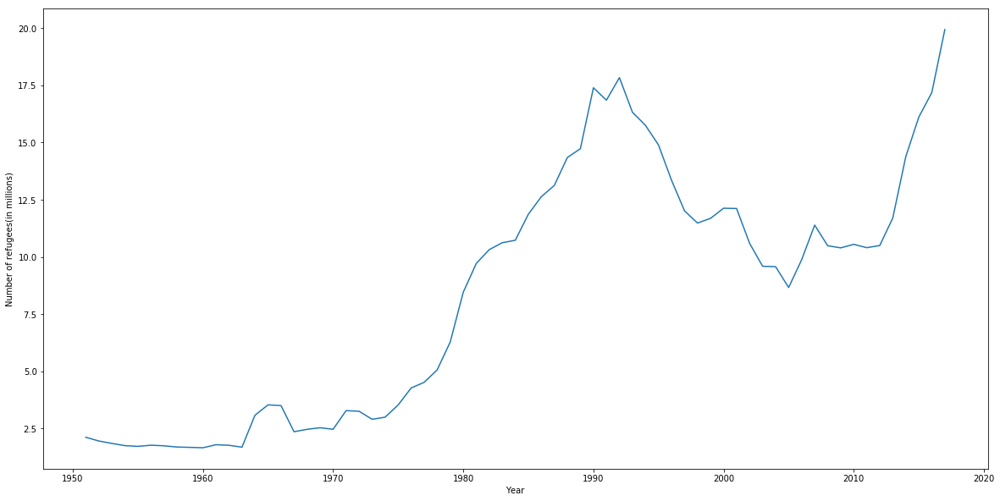

In [8]:
plt.figure(figsize=(20,10))
plt.plot(grouped)
plt.ylabel('Number of refugees(in millions)')
plt.xlabel('Year')
plt.show()

In [9]:
eu = pd.read_csv("EU.csv")
eu.head()

,ISO,Country Name,Domen
0,AUT,Austria,at
1,BEL,Belgium,be
2,BGR,Bulgaria,bg
3,HRV,Croatia,hr
4,CYP,Cyprus,cy


In [10]:
#merging EU countries with refugee number to receive ISO for mappinf and filtering
eu_refugees = pd.merge(refugees, eu, left_on='country_iso', right_on='ISO', how='inner')
eu_refugees.head()

,country_code,country_iso,ref,year,ISO,Country Name,Domen
0,AUS,AUT,282000.0,1951,AUT,Austria,at
1,AUS,AUT,238200.0,1952,AUT,Austria,at
2,AUS,AUT,215200.0,1953,AUT,Austria,at
3,AUS,AUT,150000.0,1954,AUT,Austria,at
4,AUS,AUT,110000.0,1955,AUT,Austria,at


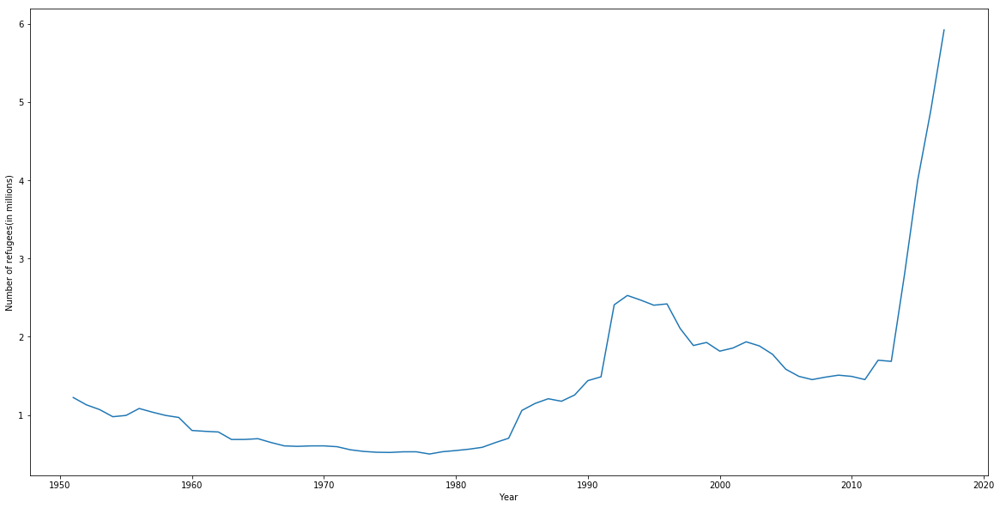

In [11]:
plt.figure(figsize=(20,10))
grouped = eu_refugees.groupby(['year']).sum() / 1000000
plt.plot(grouped)
plt.ylabel('Number of refugees(in millions)')
plt.xlabel('Year')
plt.show()

As we can see latest peek of refugees number was in 1991 (collapsing of USSR and war in Yugoslavia). Now Europe is about new crisis.

**GDELT Events Database**

Events database.

Source of codebook: http://data.gdeltproject.org/documentation/GDELT-Event_Codebook-V2.0.pdf


GDELT Event records are stored in an expanded version of the dyadic CAMEO format,
capturing two actors and the action performed by Actor1 upon Actor2. 

We used 'events_extract.py' script to get data based on the two columns - Actor1Name and Actor2Name. We filter this columns whether they contain keywork - refugee

These are the potentially good and useful columns

* "GLOBALEVENTID",
* "Day_DATE",
* "Actor1Code",
* "Actor1Name",
* "Actor1CountryCode",
* "Actor1KnownGroupCode",
* "Actor1EthnicCode",
* "Actor1Religion1Code",
* "Actor1Religion2Code",
* "Actor2Code",
* "Actor2Name",
* "Actor2CountryCode",
* "Actor2KnownGroupCode",
* "Actor2EthnicCode",
* "Actor2Religion1Code",
* "Actor2Religion2Code",
* "QuadClass",
* "GoldsteinScale",
* "NumMentions",
* "NumArticles",
* "AvgTone",
* "Actor1Geo_CountryCode",
* "Actor1Geo_Lat",
* "Actor1Geo_Long",
* "Actor2Geo_CountryCode",
* "Actor2Geo_Lat",
* "Actor2Geo_Long",
* "ActionGeo_CountryCode",
* "ActionGeo_Lat",
* "ActionGeo_Long",
* "SOURCEURL",

In [14]:
refugees = spark.read.parquet('./european_refugees.parquet')

In [15]:
#Country Codes of European Countries
country_codes = [
    'AU', 'AL', 'RS', 'BO', 'BE','BU',
    'HR','CY','EZ','DA','EN','FI','FR','GM',
    'GR','HU','EI','IT','LG','LH','LU','MT','NL','PL','PO',
    'RO','LO', 'SI','SP','SW','UK','NO','LS','IC','SZ','TU',
    'BK','RI', 'MK', 'UP'
]

We tried filter refugees table based on Actor1CountryCode, Actor2CountryCode, and ActionGeo_CountryCode. Based on the results ActionGeo_CountryCode seems more logical that's why we chose it.

In [16]:
good_columns = [
"Year_Date",
"GLOBALEVENTID",
"Day_DATE",
"Actor1Code",
"Actor1Name",
"Actor1CountryCode",
"Actor1KnownGroupCode",
"Actor1EthnicCode",
"Actor1Religion1Code",
"Actor1Religion2Code",
"Actor2Code",
"Actor2Name",
"Actor2CountryCode",
"Actor2KnownGroupCode",
"Actor2EthnicCode",
"Actor2Religion1Code",
"Actor2Religion2Code",
"QuadClass",
"GoldsteinScale",
"NumMentions",
"NumArticles",
"AvgTone",
"Actor1Geo_CountryCode",
"Actor1Geo_Lat",
"Actor1Geo_Long",
"Actor2Geo_CountryCode",
"Actor2Geo_Lat",
"Actor2Geo_Long",
"ActionGeo_CountryCode",
"ActionGeo_Lat",
"ActionGeo_Long",
"SOURCEURL",
]

In [17]:
european_refugees = refugees.where(col('ActionGeo_CountryCode').isin(country_codes)).select(good_columns)

There are very few events which are before 2015. And also the hottest period of European Refugee Crisis is after 2015. For these reasons we get the events which are after 2015

In [18]:
european_refugees = european_refugees.where(col('Year_Date') >= 2015)

In [19]:
european_refugees.select('Day_Date', 'Actor1CountryCode', 'Actor2CountryCode', 'Actor1Geo_CountryCode', 'Actor2Geo_CountryCode', 'ActionGeo_CountryCode').show()

+--------+-----------------+-----------------+---------------------+---------------------+---------------------+
|Day_Date|Actor1CountryCode|Actor2CountryCode|Actor1Geo_CountryCode|Actor2Geo_CountryCode|ActionGeo_CountryCode|
+--------+-----------------+-----------------+---------------------+---------------------+---------------------+
|20170331|              BGR|             null|                   BU|                   BU|                   BU|
|20170331|             null|             null|                   BU|                   BU|                   BU|
|20170331|             null|             null|                   BU|                   BU|                   BU|
|20170331|             null|             null|                   IT|                   SP|                   GR|
|20170331|             null|             null|                   TU|                   TU|                   TU|
|20160323|              EST|             null|                   EN|                   EN|      

**Let's see the refugee events based on the seperate European Countries**

In [21]:
european_refugees_groupby_countries = european_refugees.groupby(col('ActionGeo_CountryCode')).count()

In [22]:
pd = european_refugees_groupby_countries.toPandas()

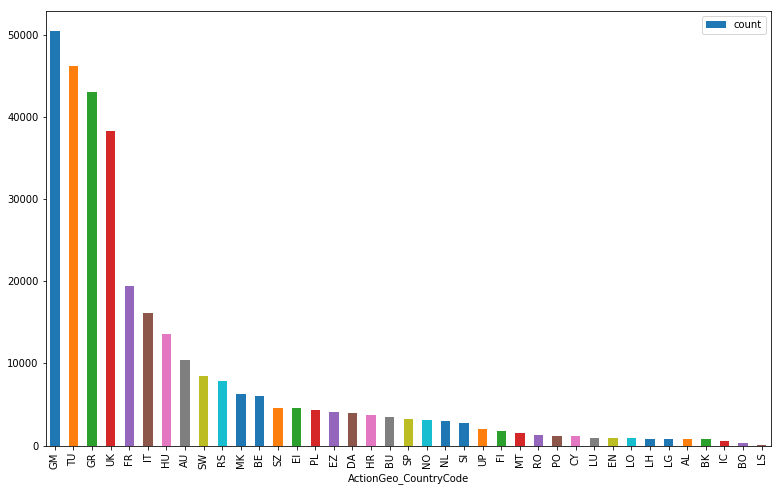

In [23]:
new_pd = pd.sort_values('count', ascending=False)
new_pd.plot.bar(x='ActionGeo_CountryCode', y='count', figsize = (13, 8))

We see the bar about the refugee events after 2015. As we see Germany, Turkey, Greece, UK, France and Italy, and Hungary are emerging countries. We can understand this tendency like that.

- Germany, UK and France are the countries which attracts the refugees in Europe
- Turkey, Greece, Italy, and Hungary are Meditterian or border between Eastern and Western Europe which the refugee events emerge mostly.

In [24]:
fips_to_country = pandas.read_csv('country-codes.csv')
fips_to_country = fips_to_country.rename(index=str, columns={"FIPS": "ActionGeo_CountryCode"})

In [25]:
fips_to_country = fips_to_country.rename(index=str, columns={"ISO3166-1-Alpha-3": "ISO-3"})

In [27]:
country_list = fips_to_country[['ISO-3', 'ActionGeo_CountryCode', 'official_name_en']]

For visualization convert fips code to country. Then we will look closer previous bar for each year. And see the evolution from 2015 to 2017.

In [28]:
european_refugees_events = european_refugees.select('AvgTone','ActionGeo_CountryCode', 'Year_Date')
european_refugees_groupby_countries = european_refugees_events.groupby(col('ActionGeo_CountryCode'), col('Year_Date')).count()

In [29]:
european_refugees_groupby_countries_pd = european_refugees_groupby_countries.toPandas()
european_refugees_groupby_countries_pd =  european_refugees_groupby_countries_pd.merge(country_list, how = 'left', on='ActionGeo_CountryCode')

In [30]:
european_refugees_groupby_countries_pd.head()

,ActionGeo_CountryCode,Year_Date,count,ISO-3,official_name_en
0,IT,2015,5323,ITA,Italy
1,BE,2016,2845,BEL,Belgium
2,IT,2016,7003,ITA,Italy
3,NL,2015,1206,BES,"Bonaire, Sint Eustatius and Saba"
4,NL,2015,1206,NLD,Netherlands


In [31]:
d = european_refugees_groupby_countries_pd[['Year_Date', 'count', 'ISO-3', 'official_name_en']]

In [33]:
d.head()

,Year_Date,count,ISO-3,official_name_en
0,2015,5323,ITA,Italy
1,2016,2845,BEL,Belgium
2,2016,7003,ITA,Italy
3,2015,1206,BES,"Bonaire, Sint Eustatius and Saba"
4,2015,1206,NLD,Netherlands


In [35]:
out = d.to_json(orient='records')
with open('events_count_final.json', 'w') as f:
    f.write(out)

We get the json file for the number of the events related to refugees for displaying them in the d3.js map.

Now let's focus on average tone. We are repeating the same step for visualization of map with grouping by country code and year to see the evolution of media coverage through 3 years.

In [41]:
european_refugees_tone = european_refugees.select('AvgTone', 'ActionGeo_CountryCode', 'Year_Date')
european_refugees_tone_pd = european_refugees_tone.toPandas()

european_refugees_tone_pd['Year_Date'] = european_refugees_tone_pd['Year_Date'].astype(int)

In [24]:
tone_groups = european_refugees_tone_pd.groupby(['Year_Date','ActionGeo_CountryCode'], as_index=False).median()
tone_groups = tone_groups.merge(country_list, how = 'left', on='ActionGeo_CountryCode')

In [28]:
d = tone_groups[['Year_Date', 'AvgTone', 'ISO-3', 'official_name_en']]
d.head()

,Year_Date,AvgTone,ISO-3,official_name_en
0,2015,-5.481283,ALB,Albania
1,2015,-5.000000,AUT,Austria
2,2015,-4.424779,BEL,Belgium
3,2015,-4.367470,BIH,Bosnia and Herzegovina
4,2015,-3.225806,BLR,Belarus


In [29]:
out = d.to_json(orient='records')
with open('events_avgtone_final.json', 'w') as f:
    f.write(out)

We get the json file for the average tone in the same way.

We will perform the clustering on the different metrics, but first we should find which number is more suitable for clusters. For that we are doing cumulative histogram, and see the proportion of the average tone over the number of the countries. Because of the average tone is an important metric, we mainly base our clustering on it. We see that, we can take the we can divide average tone of the countries into 3 subgroup - positive, negative, and neutral tone. However we will do 4-clustering, because we will use the 4th metric for the second variable besides the average tone.

(array([0.02631579, 0.02631579, 0.02631579, 0.02631579, 0.02631579,
        0.02631579, 0.02631579, 0.02631579, 0.02631579, 0.02631579,
        0.02631579, 0.05263158, 0.07894737, 0.10526316, 0.15789474,
        0.15789474, 0.23684211, 0.28947368, 0.31578947, 0.39473684,
        0.42105263, 0.44736842, 0.44736842, 0.52631579, 0.52631579,
        0.57894737, 0.57894737, 0.57894737, 0.63157895, 0.68421053,
        0.71052632, 0.71052632, 0.73684211, 0.73684211, 0.76315789,
        0.76315789, 0.76315789, 0.78947368, 0.78947368, 0.81578947,
        0.81578947, 0.84210526, 0.86842105, 0.86842105, 0.89473684,
        0.89473684, 0.94736842, 0.94736842, 0.94736842, 1.        ]),
 array([-5.89569139, -5.81799204, -5.74029269, -5.66259334, -5.58489399,
        -5.50719464, -5.42949529, -5.35179594, -5.27409658, -5.19639723,
        -5.11869788, -5.04099853, -4.96329918, -4.88559983, -4.80790048,
        -4.73020113, -4.65250177, -4.57480242, -4.49710307, -4.41940372,
        -4.34170437, -4.26

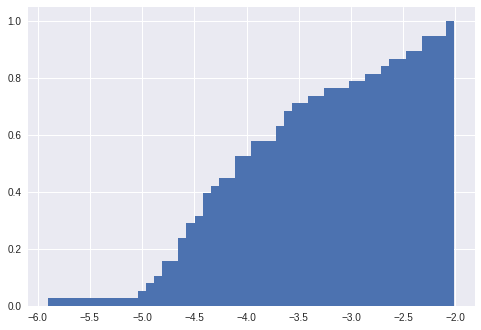

In [88]:
plt.grid(True)
plt.hist(avg_tone, cumulative=True, bins=50, normed=True)

Now we will focus on the clustering of the countries based on the different metrics.

In [37]:
tone_groups = tone_groups[['Year_Date', 'AvgTone', 'ISO-3']]
tone_groups.head()

,Year_Date,AvgTone,ISO-3
38,2016,-4.347826,ALB
39,2016,-4.617923,AUT
40,2016,-4.389313,BEL
41,2016,-2.290951,BIH
42,2016,-2.312502,BLR


We merge the average tone and the number of the articles, and will perform k-means clustering based on these two metrics.

In [46]:
new_data = data.merge(tone_groups, on='ISO-3')
new_data = new_data[['ISO-3', 'count', 'AvgTone', 'official_name_en']]
new_data.head()

,ISO-3,count,AvgTone,official_name_en
0,BEL,2845,-4.389313,Belgium
1,ITA,7003,-4.366812,Italy
2,TUR,24638,-4.770587,Turkey
3,EST,244,-2.597403,Estonia
4,ESP,1187,-3.679417,Spain


In [47]:
new_data = new_data.rename(index=str, columns={"official_name_en": "Name"})

In [48]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize

new_data['count'] =  (new_data['count'] - new_data['count'].mean()) / new_data['count'].std()
new_data['AvgTone'] =  (new_data['AvgTone'] - new_data['AvgTone'].mean()) / new_data['AvgTone'].std()

new_data.head()

,ISO-3,count,AvgTone,Name
0,BEL,-0.123633,-0.585366,Belgium
1,ITA,0.500414,-0.561435,Italy
2,TUR,3.147134,-0.990883,Turkey
3,EST,-0.514000,1.320482,Estonia
4,ESP,-0.372471,0.169668,Spain


In [54]:
from scipy import stats
clmns = ['AvgTone', 'count']

new_data_std = stats.zscore(new_data[clmns])
kmeans = KMeans(n_clusters=4, random_state=0).fit(new_data_std)

labels = kmeans.labels_
new_data['clusters'] = labels

clmns.extend(['clusters'])

new_data[clmns].groupby(['clusters']).mean()

,AvgTone,count
clusters,,
0,-0.841822,-0.098858
1,1.465332,-0.517219
2,-0.775013,2.740708
3,0.071313,-0.418560


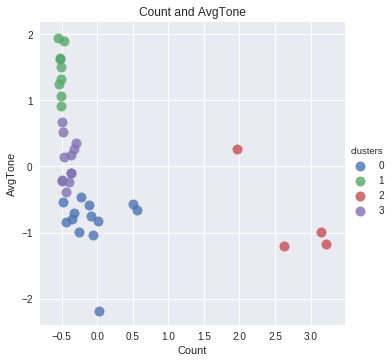

In [55]:
import seaborn as sns
#Scatter plot of Wattage and Duration
sns.lmplot('count', 'AvgTone',
           data=new_data,
           fit_reg=False, 
           hue="clusters",  
           scatter_kws={"marker": "D", 
                        "s": 100})
plt.title('Count and AvgTone')
plt.xlabel('Count')
plt.ylabel('AvgTone')

In [56]:
new_data.head()

,ISO-3,count,AvgTone,Name,clusters
0,BEL,-0.123633,-0.585366,Belgium,0
1,ITA,0.500414,-0.561435,Italy,0
2,TUR,3.147134,-0.990883,Turkey,2
3,EST,-0.514000,1.320482,Estonia,1
4,ESP,-0.372471,0.169668,Spain,3


In [57]:
out= new_data.to_json(orient='records')
with open('tone_count_clusters_new.json', 'w') as f:
    f.write(out)

Now we will perform the clustering based on the gdp per capita of the countries and average tone of their media.

In [67]:
gdp = pandas.read_csv('gdp_per_capita.csv')

gdp = gdp.rename(index=str, columns={"Country Code": "ISO-3"})
gdp = gdp.rename(index=str, columns={"2016": "GDP"})

gdp.head()


,Country Name,ISO-3,GDP
0,Aruba,ABW,NaN
1,Afghanistan,AFG,561.778746
2,Angola,AGO,3308.772828
3,Albania,ALB,4131.872341
4,Andorra,AND,37231.815671


We loaded the gdp per capita of the each country, now we are merging them with average tone.

In [73]:
tone_and_gdp = tone_groups.merge(gdp, on='ISO-3')
tone_and_gdp.head()

tone_and_gdp = tone_and_gdp.rename(index=str, columns={"Country Name": "Name"})

tone_and_gdp = tone_and_gdp[['Name', 'ISO-3', 'AvgTone', 'GDP']]
tone_and_gdp.head()

,Name,ISO-3,AvgTone,GDP
0,Albania,ALB,-4.347826,4131.872341
1,Austria,AUT,-4.617923,44731.010855
2,Belgium,BEL,-4.389313,41260.977551
3,Bosnia and Herzegovina,BIH,-2.290951,4808.636043
4,Belarus,BLR,-2.312502,5022.626643


In [77]:
tone_and_gdp['GDP'] =  (tone_and_gdp['GDP'] - tone_and_gdp['GDP'].mean()) / tone_and_gdp['GDP'].std()
tone_and_gdp['AvgTone'] =  (tone_and_gdp['AvgTone'] - tone_and_gdp['AvgTone'].mean()) / tone_and_gdp['AvgTone'].std()

In [84]:
from scipy import stats
clmns = ['AvgTone', 'GDP']

tone_and_gdp_std = stats.zscore(tone_and_gdp[clmns])

kmeans_gdp = KMeans(n_clusters=4, random_state=0).fit(tone_and_gdp_std)

labels = kmeans_gdp.labels_
tone_and_gdp['clusters'] = labels

clmns.extend(['clusters'])

tone_and_gdp[clmns].groupby(['clusters']).mean()

,AvgTone,GDP
clusters,,
0,1.118539,1.882115
1,-0.561470,-0.654223
2,1.295329,-0.687257
3,-0.532513,0.819167


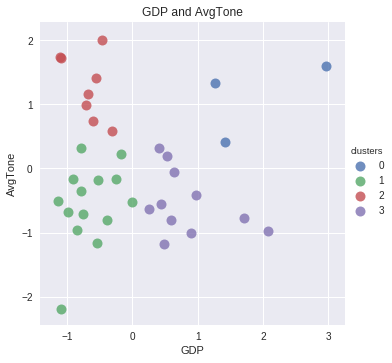

In [85]:
import seaborn as sns
#Scatter plot of Wattage and Duration
sns.lmplot('GDP', 'AvgTone',
           data=tone_and_gdp,
           fit_reg=False, 
           hue="clusters",  
           scatter_kws={"marker": "D", 
                        "s": 100})
plt.title('GDP and AvgTone')
plt.xlabel('GDP')
plt.ylabel('AvgTone')

In [86]:
tone_and_gdp.head()

,Name,ISO-3,AvgTone,GDP,clusters
0,Albania,ALB,-0.503888,-1.129755,1
1,Austria,AUT,-0.799227,0.592704,3
2,Belgium,BEL,-0.549252,0.445484,3
3,Bosnia and Herzegovina,BIH,1.745204,-1.101042,2
4,Belarus,BLR,1.721638,-1.091964,2


In [87]:
out= tone_and_gdp.to_json(orient='records')
with open('tone_gdp_clusters_new.json', 'w') as f:
    f.write(out)

We did the clustering of the gpd and average tone. Now we are done with clustering.

**GDELT Mention Database**

Mentions database.

We used 'extract_mentions.py' script to get to mentions. We joined mentions with events database based on the GLOBALEVENTID

These are the potentially good and useful columns

- "GLOBALEVENTID",
- "EventTimeDate",
- "MentionTimeDate",
- "MentionType",
- "MentionSourceName",
- "MentionIdentifier",
- "SentenceID",
- "Actor1CharOffset",
- "Actor2CharOffset",
- "ActionCharOffset",
- "InRawText",
- "Confidence",
- "MentionDocLen",
- "MentionDocTone",
- "MentionDocTranslationInfo",
- "Extras"

In [2]:
mentions = spark.read.parquet("joined.parquet")

In [5]:
european_mentions = mentions.where(col('ActionGeo_CountryCode').isin(country_codes))

In [6]:
#show only web-sites (only in web sites we can try to detect origin of news)
#web sites is a majority of mentions in this dataset
european_mentions.select(col("MentionSourceName_MENTIONS")).where(col("MentionType_MENTIONS") == 1).show()

+--------------------------+
|MentionSourceName_MENTIONS|
+--------------------------+
|               mrtimes.com|
|                  kawc.org|
|          tucsonweekly.com|
|      middleeastmonitor...|
|        middevonstar.co.uk|
|              novinite.com|
|          commondreams.org|
|          commondreams.org|
|             focus-fen.net|
|             focus-fen.net|
|            gulf-times.com|
|                spiegel.de|
|          101touchfm.co.uk|
|        banburysound.co.uk|
|            964eagle.co.uk|
|               mix96.co.uk|
|             arrowfm.co.uk|
|           kingdomfm.co.uk|
|             klfm967.co.uk|
|           direktbroker.de|
+--------------------------+
only showing top 20 rows



In [7]:
#take only web sites
european_mentions = european_mentions.where((col("MentionType_MENTIONS") == 1))

In [8]:
#load EU.csv 
#we need ISO code to locate countries on the map and TLD to locate origin of web-site
eu = pandas.read_csv("EU.csv",skipinitialspace=True)
eu.head()

,ISO,Country Name,Domen
0,AUT,Austria,at
1,BEL,Belgium,be
2,BGR,Bulgaria,bg
3,HRV,Croatia,hr
4,CYP,Cyprus,cy


In [9]:
#taking TLD of mentions
european_mentions = european_mentions.withColumn("Domens_MENTIONS", (substring(col("MentionSourceName_MENTIONS"), -2, 2)))

In [10]:
grouped = european_mentions.groupBy('Domens_MENTIONS').count()
grouped.orderBy(desc("count")).show()

+---------------+------+
|Domens_MENTIONS| count|
+---------------+------+
|             om|591479|
|             uk| 64421|
|             rg| 51942|
|             au| 28238|
|             et| 27729|
|             tv|  6613|
|             eu|  6099|
|             ie|  4923|
|             ca|  4883|
|             nt|  4800|
|             za|  3921|
|             de|  3778|
|             cn|  3454|
|             my|  3249|
|             gr|  2926|
|             fo|  2888|
|             pk|  2839|
|             nz|  2783|
|             ch|  2037|
|             tr|  1789|
+---------------+------+
only showing top 20 rows



Here we can see that majority of mentions are from .com, .net and .org TLS so we cannot detect an oridin of this domen

In [12]:
#number in which we are not interested
array = eu['Domen'].values.tolist()
unknown_domens = european_mentions.where(col("Domens_MENTIONS").isin(array) == False)

In [13]:
#But we have still pretty a lot of web sites to analyze
known_domens = european_mentions.where(col("Domens_MENTIONS").isin(array)).toPandas()
known_domens.count()

GLOBALEVENTID                         93344
Day_DATE                              93344
MonthYear_Date                        93344
Year_Date                             93344
FractionDate                          93344
Actor1Code                            90257
Actor1Name                            90257
Actor1CountryCode                     35062
Actor1KnownGroupCode                   1784
Actor1EthnicCode                        263
Actor1Religion1Code                     783
Actor1Religion2Code                     169
Actor1Type1Code                       59646
Actor1Type2Code                        1440
Actor1Type3Code                          21
Actor2Code                            82686
Actor2Name                            82686
Actor2CountryCode                     24294
Actor2KnownGroupCode                    926
Actor2EthnicCode                        185
Actor2Religion1Code                     294
Actor2Religion2Code                      57
Actor2Type1Code                 

we only pick up the mention source from the website because it took most of the mention source and we can find the origins of the mentions by the .name (like: .uk/.de). Those origins could tell us where the mentions come from.




In [15]:
#merging mentions and EU to receive ISO codes for mapping
eu_news = pandas.merge(known_domens, eu, left_on='Domens_MENTIONS', right_on='Domen', how='inner')
#extracting year of mention
eu_news['year_MENTIONS'] = eu_news['MentionTimeDate_MENTIONS'].apply(lambda x: int(str(x)[:4]))
eu_news.head()

,GLOBALEVENTID,Day_DATE,MonthYear_Date,Year_Date,FractionDate,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,...,Confidence_MENTIONS,MentionDocLen_MENTIONS,MentionDocTone_MENTIONS,MentionDocTranslationInfo_MENTIONS,Extras_MENTIONS,Domens_MENTIONS,ISO,Country Name,Domen,year_MENTIONS
0,412733685,20150227,201502,2015,2015.156250,REF,REFUGEE,None,None,None,...,40,5489,-4.684096,None,None,uk,GBR,United Kingdom,uk,2015
1,426760292,20150420,201504,2015,2015.301392,IGOEUREECGOV,EUROPEAN UNION,EUR,EEC,None,...,100,3129,-7.269155,None,None,uk,GBR,United Kingdom,uk,2015
2,426760292,20150420,201504,2015,2015.301392,IGOEUREECGOV,EUROPEAN UNION,EUR,EEC,None,...,100,3129,-7.283464,None,None,uk,GBR,United Kingdom,uk,2015
3,426760292,20150420,201504,2015,2015.301392,IGOEUREECGOV,EUROPEAN UNION,EUR,EEC,None,...,100,3104,-7.341270,None,None,uk,GBR,United Kingdom,uk,2015
4,426760292,20150420,201504,2015,2015.301392,IGOEUREECGOV,EUROPEAN UNION,EUR,EEC,None,...,100,3114,-7.326733,None,None,uk,GBR,United Kingdom,uk,2015


In [16]:
#grouping by country and year
grouped = eu_news[['year_MENTIONS','ISO','GLOBALEVENTID']].groupby(['year_MENTIONS','ISO'], as_index=False).count()
grouped.head()

,year_MENTIONS,ISO,GLOBALEVENTID
0,2015,AUT,686
1,2015,BEL,63
2,2015,BGR,172
3,2015,CHE,860
4,2015,CYP,29


In [17]:
data = []
#taking years for slider
years = grouped[['year_MENTIONS']].drop_duplicates().values

#creating dict for every year
for i in range(years.shape[0]):
    year_data = grouped.loc[grouped['year_MENTIONS'] == years[i][0]]
    data.append(dict(type='choropleth',
             locations = year_data['ISO'].astype(str),
             z=year_data['GLOBALEVENTID'].astype(float),
             locationmode='ISO-3'))
    
# create the steps for the slider
steps = []
for i in range(len(data)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data)],
                label='Year {}'.format(i + 2015))
    step['args'][1][i] = True
    steps.append(step)

sliders = [dict(active=0,
                pad={"t": 1},
                steps=steps)]    
layout = dict(geo=dict(scope='europe', projection ={'type':'eckert4'}),
              sliders=sliders)

fig = dict(data=data, 
           layout=layout)
plotly.offline.iplot(fig)

On this map we can clearly see outlier as Great Britain. This happens because GDELT is mostly analyzing text in English. So in order to receive better visualization, we need to remove English-speaking countries

In [19]:
#removing English-speaking countries
grouped = grouped.loc[(grouped['ISO'] != 'GBR') & (grouped['ISO'] != 'IRL')]

#mapping
data = []
years = grouped[['year_MENTIONS']].drop_duplicates().values

for i in range(years.shape[0]):
    year_data = grouped.loc[grouped['year_MENTIONS'] == years[i][0]]
    data.append(dict(type='choropleth',
             locations = year_data['ISO'].astype(str),
             z=year_data['GLOBALEVENTID'].astype(float),
             locationmode='ISO-3'))
    
steps = []
for i in range(len(data)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data)],
                label='Year {}'.format(i + 2015))
    step['args'][1][i] = True
    steps.append(step)

sliders = [dict(active=0,
                pad={"t": 1},
                steps=steps)]    
layout = dict(geo=dict(scope='europe', projection ={'type':'eckert4'}),
              sliders=sliders)

fig = dict(data=data, 
           layout=layout)
plotly.offline.iplot(fig)

On this map we can notice that Germany is a leader in reporting news about refugees. But in 2016 Greece reported a majority of news. This can be understable as number of refugees in 2016 was doubled compared to 2015 according to UNHCR dataset. Also Greece and Italy are main gates for refugees from Syria and Africa. In 2017 Poland shows big interest in refugee question compared to other countries (but number of refugees do not increased significantly) that can be explained by argue between Poland and EU about inviting refugees to Poland.

In [20]:
grouped = eu_news[['year_MENTIONS','ISO','MentionDocTone_MENTIONS']].groupby(['year_MENTIONS','ISO'], as_index=False).median()
grouped.head()

,year_MENTIONS,ISO,MentionDocTone_MENTIONS
0,2015,AUT,-4.776119
1,2015,BEL,-3.448276
2,2015,BGR,-3.092593
3,2015,CHE,-4.635762
4,2015,CYP,-0.540541


In [21]:
data = []
years = grouped[['year_MENTIONS']].drop_duplicates().values

# let's create some additional, random data
for i in range(years.shape[0]):
    year_data = grouped.loc[grouped['year_MENTIONS'] == years[i][0]]
    data.append(dict(type='choropleth',
             locations = year_data['ISO'].astype(str),
             z=year_data['MentionDocTone_MENTIONS'].astype(float),
             locationmode='ISO-3'))
    
# let's create the steps for the slider
steps = []
for i in range(len(data)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data)],
                label='Year {}'.format(i + 2015))
    step['args'][1][i] = True
    steps.append(step)

sliders = [dict(active=0,
                pad={"t": 1},
                steps=steps)]    
layout = dict(geo=dict(scope='europe', projection ={'type':'eckert4'}),
              sliders=sliders)

fig = dict(data=data, 
           layout=layout)
plotly.offline.iplot(fig)

In general, we can notice that Europe does not welcome refugees (all countries have negative values). Also we can see that the most negative values have countries of Western Europe, that faced this crisis more Eastern ones.

# GKG Table

GKG table gives us more precise tones. So we diecide to use GKG table to explore the time revolution of tones.

In [42]:
#import data from GKF table with the filter of 'REGUGEE'
gkg_df = spark.read.parquet('filtered_gkg_df.parquet')

In [43]:
#convert DATE AND V2TONE to pandas
DATE=gkg_df.select('DATE').toPandas()
V2Tone=gkg_df.select('V2Tone').toPandas()

In [44]:
#split the columns V2 Tone
def split_tone_(string):
    list=string.split(',')
    return  pd.Series([float(list[0]), float(list[1]), float(list[2]), float(list[3]),
                       float(list[4]), float(list[5]), float(list[6])])

V2Tone[['Tone','Positive_Score','Negative_Score','Polarity',
        'Activity_Reference_Density','Self_Group_Reference_Density',
        'Word_Count']]=V2Tone['V2Tone'].apply(lambda x:split_tone_(x) )

In [70]:
#combine DATE and the elements of V2TONE to one dataframe
V2Tone=V2Tone.drop(V2Tone.columns[0], axis=1)
DATE1=DATE['DATE'].apply(lambda x: float(x[0:8]))
V2Tone['DATE']=DATE1

In [71]:
#split the dataframe to year 2015, year 2016, year 2017
V2Tone_2015=V2Tone[V2Tone.DATE<20160000]
V2Tone_2016=V2Tone[(V2Tone.DATE>20160000) & (V2Tone.DATE<20170000)]
V2Tone_2017=V2Tone[(V2Tone.DATE>20170000) & (V2Tone.DATE<20180000)]

Text(0.5,1,'number of articles of 2015')

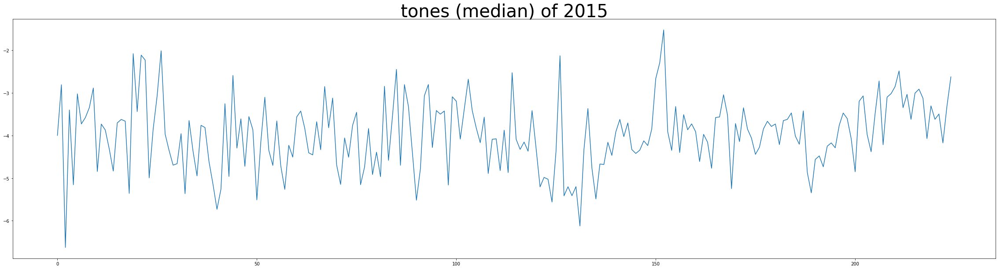

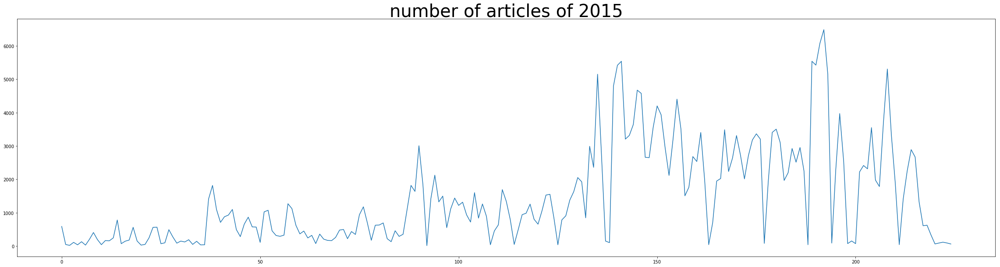

In [78]:
#tone 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_2015.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2015',fontsize=40)

#counts 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_2015.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2015',fontsize=40)


Text(0.5,1,'number of articles of 2016')

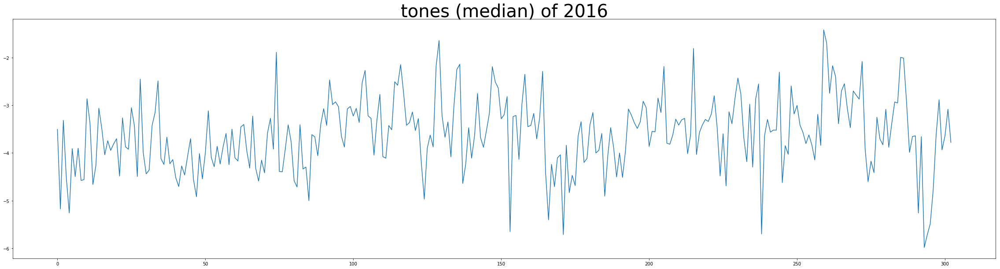

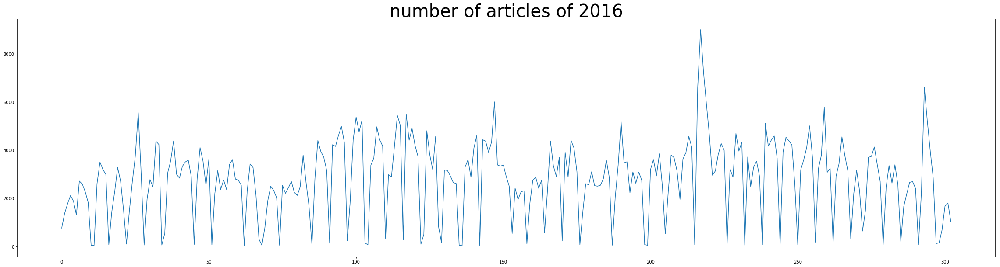

In [79]:
#tone 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_2016.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2016',fontsize=40)

#counts 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_2016.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2016',fontsize=40)

Text(0.5,1,'number of articles of 2017')

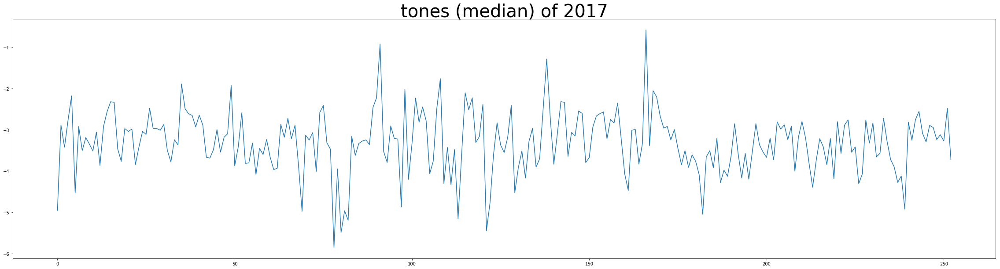

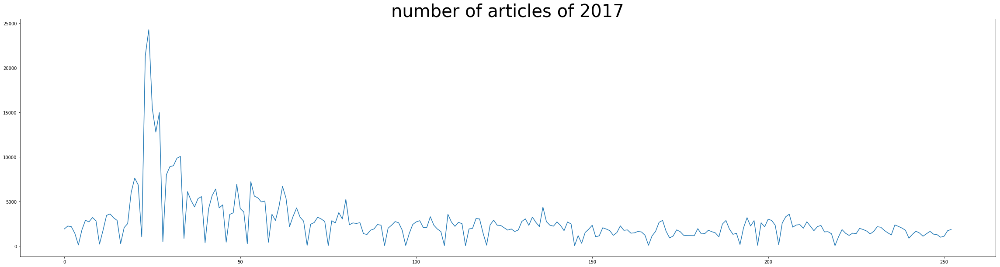

In [80]:
#tone 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_2017.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2017',fontsize=40)

#counts 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_2017.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2017',fontsize=40)

GKG website:

to get the location of the publisher of GKG table. We decide to take only the courses from website.

Then we will use the URL information from the website to get the countries of the sources.

In [81]:
#only take the source from the web
gkg_web=gkg_df.where(col("SourceCollectionIdentifier") == 1)

In [82]:
DATE=gkg_web.select('DATE').toPandas()
V2Tone=gkg_web.select('V2Tone').toPandas()

In [83]:
def split_tone_(string):
    list=string.split(',')
    return  pd.Series([float(list[0]), float(list[1]), float(list[2]), float(list[3]),
                       float(list[4]), float(list[5]), float(list[6])])

V2Tone[['Tone','Positive_Score','Negative_Score','Polarity',
        'Activity_Reference_Density','Self_Group_Reference_Density',
        'Word_Count']]=V2Tone['V2Tone'].apply(lambda x:split_tone_(x) )

V2Tone=V2Tone.drop(V2Tone.columns[0], axis=1)

DATE1=DATE['DATE'].apply(lambda x: float(x[0:8]))
V2Tone['DATE']=DATE1

In [85]:
#get the URL link
DocumentIdentifier=gkg_web.select('DocumentIdentifier').toPandas()
DocumentIdentifier=DocumentIdentifier['DocumentIdentifier'].apply(lambda x: x.split('/')[2])

#get the domain
domen=DocumentIdentifier.apply(lambda x: x[-2:])

In [86]:
DocumentIdentifier=pd.DataFrame(DocumentIdentifier)
DocumentIdentifier['domans']=domen

In [87]:
#load EU.csv 
#we need ISO code to locate countries on the map and TLD to locate origin of web-site
eu = pd.read_csv("EU.csv",skipinitialspace=True)

array = eu['Domen'].values.tolist()
mask_eu=DocumentIdentifier.domans.isin(array)
DocumentIdentifier_eu=DocumentIdentifier[mask_eu]
V2Tone_eu=V2Tone[mask_eu]
DocumentIdentifier_eu
V2Tone_eu['domans']=DocumentIdentifier_eu['domans']
V2Tone_eu = pd.merge(V2Tone_eu, eu, left_on='domans', right_on='Domen', how='inner')

/anaconda3/envs/ada/lib/python3.6/site-packages/ipykernel/__main__.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [88]:
#split them to differen years
V2Tone_eu_2015=V2Tone_eu[V2Tone_eu.DATE<20160000]
V2Tone_eu_2016=V2Tone_eu[(V2Tone_eu.DATE>20160000) & (V2Tone_eu.DATE<20170000)]
V2Tone_eu_2017=V2Tone_eu[(V2Tone_eu.DATE>20170000) & (V2Tone_eu.DATE<20180000)]

now, we want to focuns on the time revolution of 4 countries: United Kingdom, Greece, Germany, Turkey

In [90]:
V2Tone_eu_2015_uk=V2Tone_eu_2015[V2Tone_eu_2015['Country Name']=='United Kingdom']
V2Tone_eu_2015_greece=V2Tone_eu_2015[V2Tone_eu_2015['Country Name']=='Greece']
V2Tone_eu_2015_germany=V2Tone_eu_2015[V2Tone_eu_2015['Country Name']=='Germany']
V2Tone_eu_2015_turkey=V2Tone_eu_2015[V2Tone_eu_2015['Country Name']=='Turkey']


V2Tone_eu_2016_uk=V2Tone_eu_2016[V2Tone_eu_2016['Country Name']=='United Kingdom']
V2Tone_eu_2016_greece=V2Tone_eu_2016[V2Tone_eu_2016['Country Name']=='Greece']
V2Tone_eu_2016_germany=V2Tone_eu_2016[V2Tone_eu_2016['Country Name']=='Germany']
V2Tone_eu_2016_turkey=V2Tone_eu_2016[V2Tone_eu_2016['Country Name']=='Turkey']


V2Tone_eu_2017_uk=V2Tone_eu_2017[V2Tone_eu_2017['Country Name']=='United Kingdom']
V2Tone_eu_2017_greece=V2Tone_eu_2017[V2Tone_eu_2017['Country Name']=='Greece']
V2Tone_eu_2017_germany=V2Tone_eu_2017[V2Tone_eu_2017['Country Name']=='Germany']
V2Tone_eu_2017_turkey=V2Tone_eu_2017[V2Tone_eu_2017['Country Name']=='Turkey']

Text(0.5,1,'number of articles of 2015 in turkey')

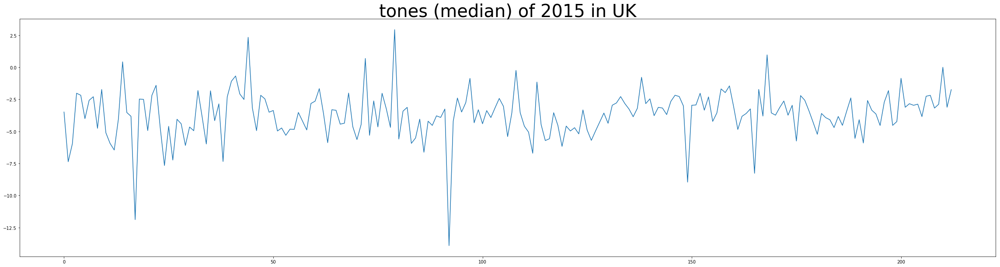

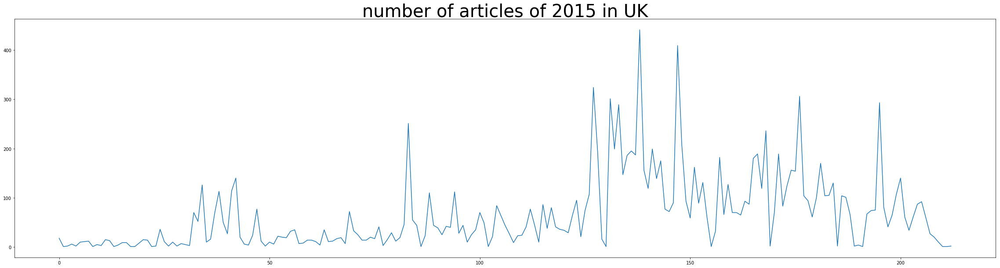

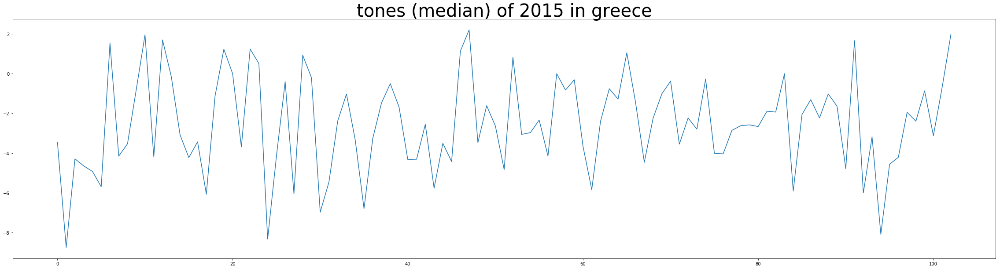

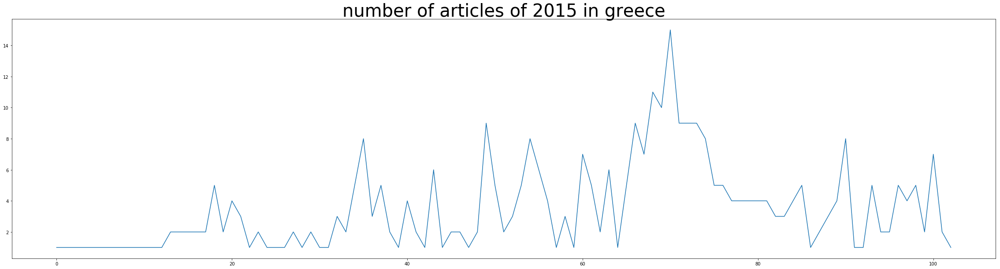

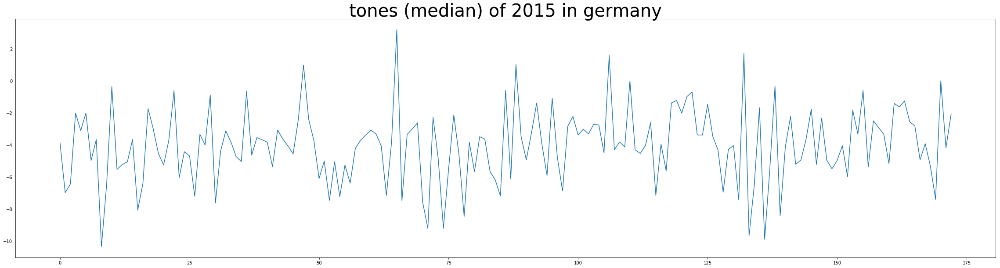

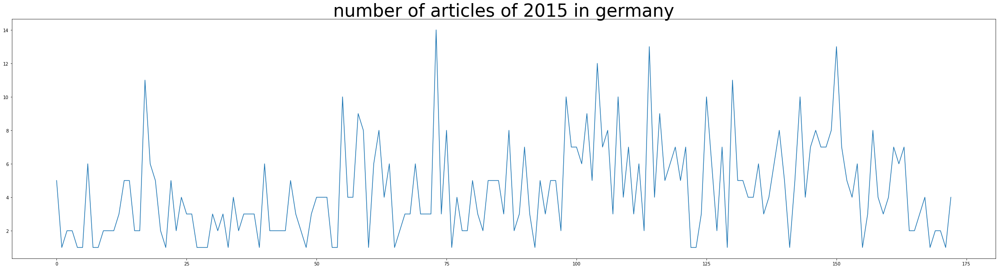

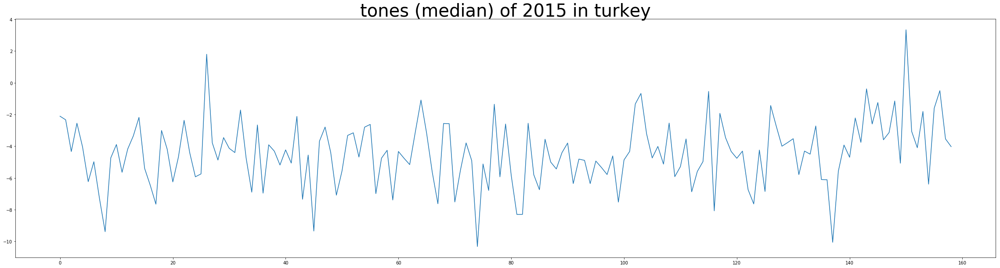

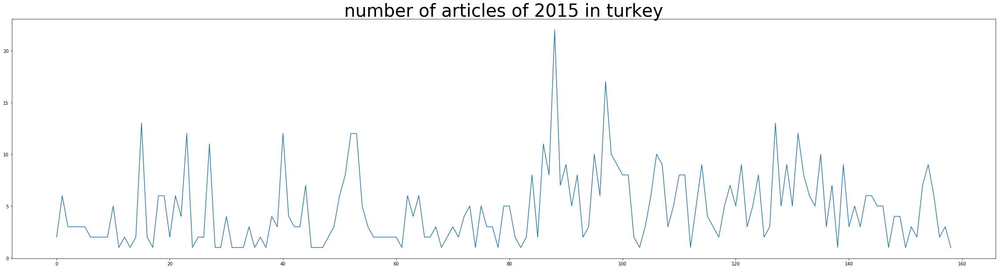

In [98]:
#tone 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_uk.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2015 in UK',fontsize=40)
#counts 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_uk.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2015 in UK',fontsize=40)


#tone 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_greece.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2015 in greece',fontsize=40)
#counts 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_greece.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2015 in greece',fontsize=40)

#tone 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_germany.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2015 in germany',fontsize=40)
#counts 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_germany.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2015 in germany',fontsize=40)


#tone 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_turkey.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2015 in turkey',fontsize=40)
#counts 2015
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2015_turkey.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2015 in turkey',fontsize=40)



Text(0.5,1,'number of articles of 2016 in turkey')

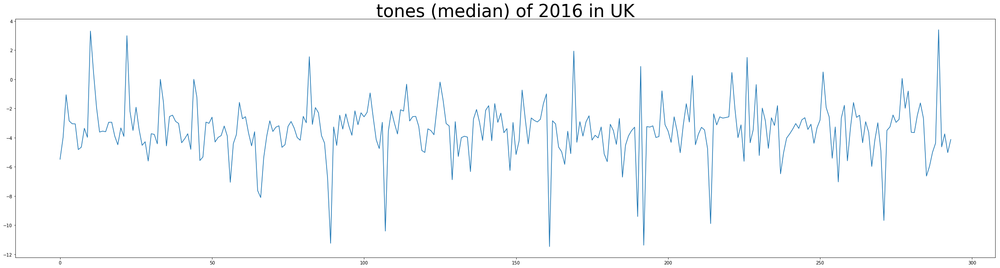

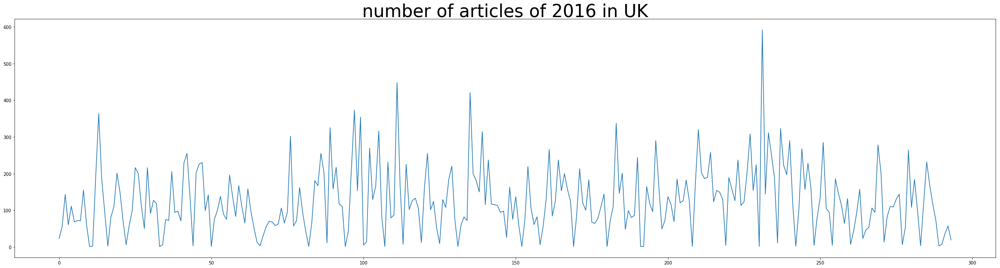

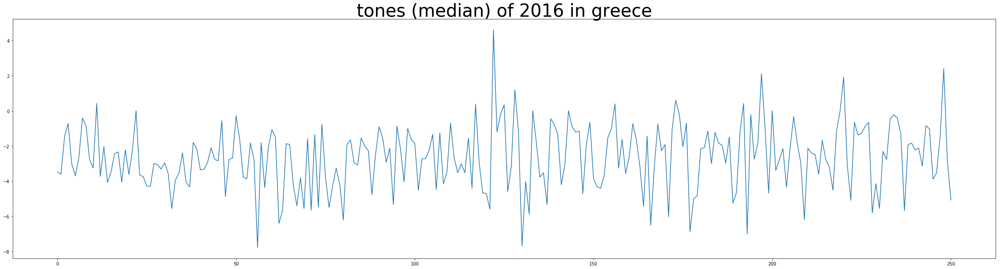

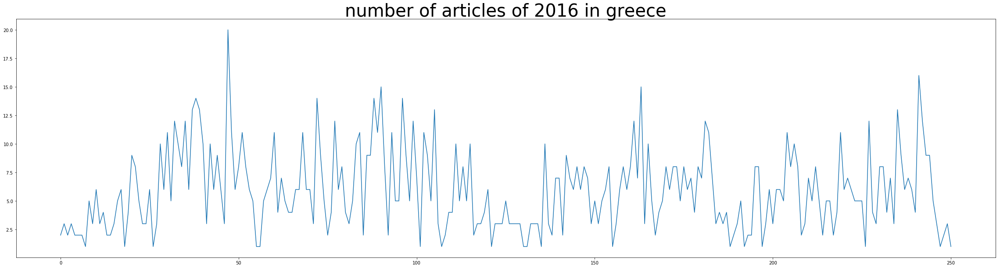

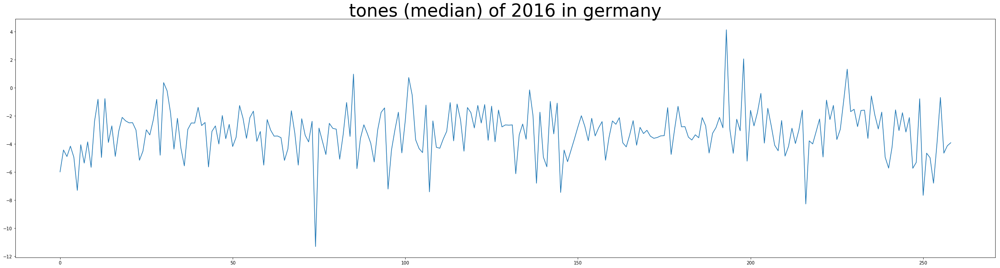

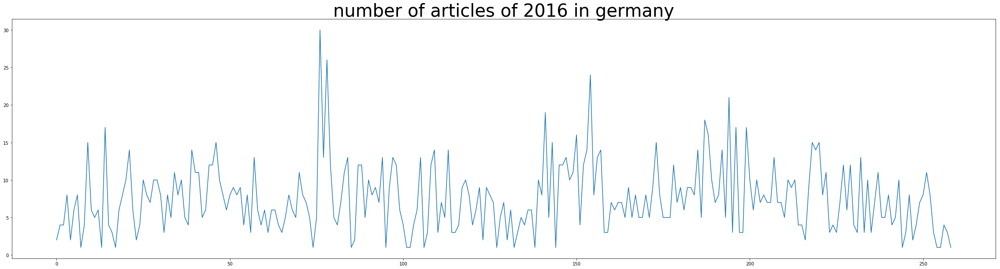

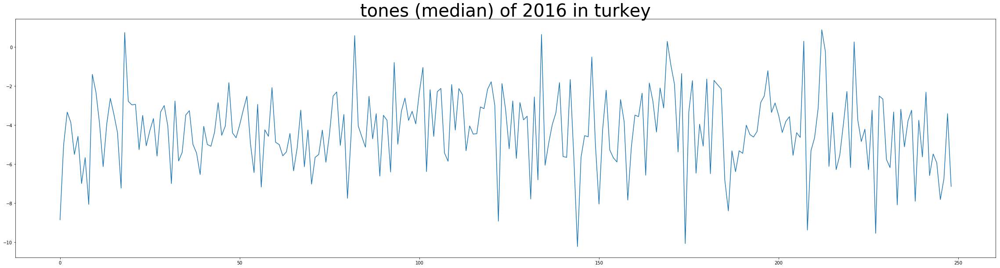

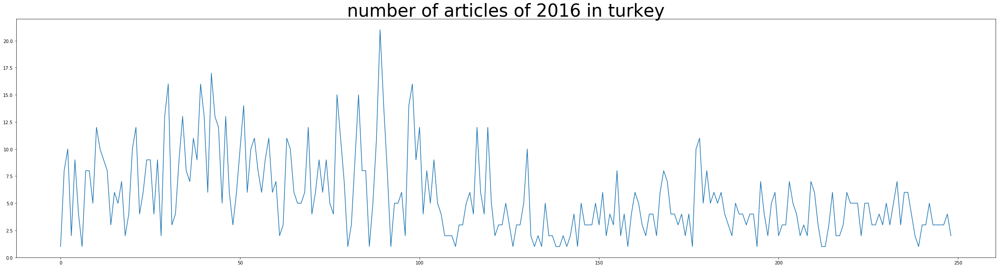

In [99]:
#tone 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_uk.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2016 in UK',fontsize=40)
#counts 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_uk.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2016 in UK',fontsize=40)


#tone 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_greece.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2016 in greece',fontsize=40)
#counts 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_greece.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2016 in greece',fontsize=40)

#tone 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_germany.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2016 in germany',fontsize=40)
#counts 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_germany.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2016 in germany',fontsize=40)


#tone 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_turkey.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2016 in turkey',fontsize=40)
#counts 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2016_turkey.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2016 in turkey',fontsize=40)

Text(0.5,1,'number of articles of 2017 in turkey')

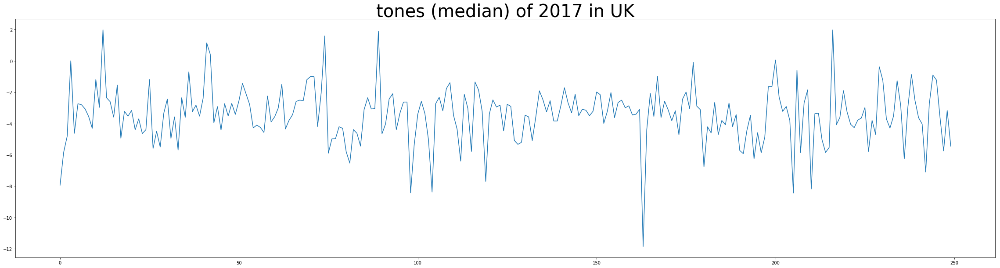

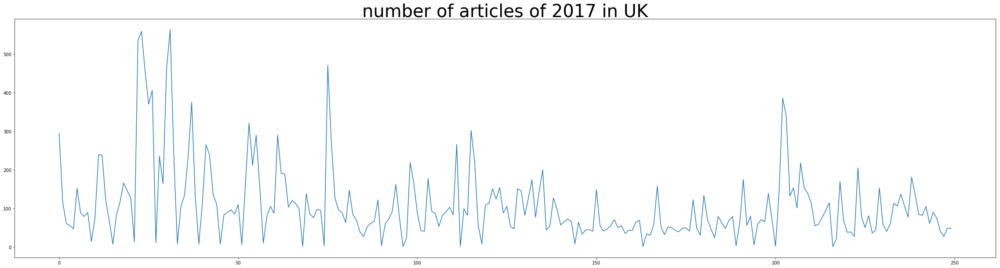

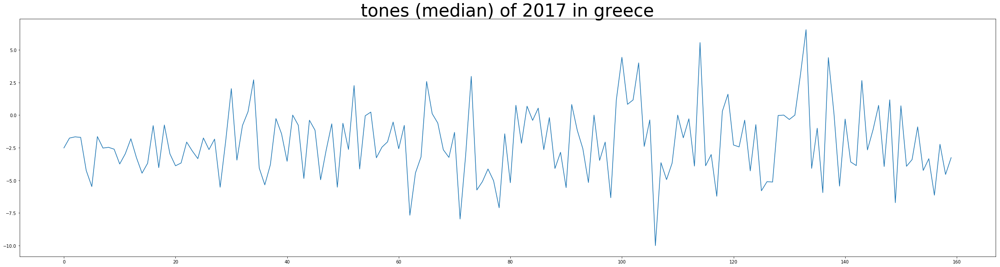

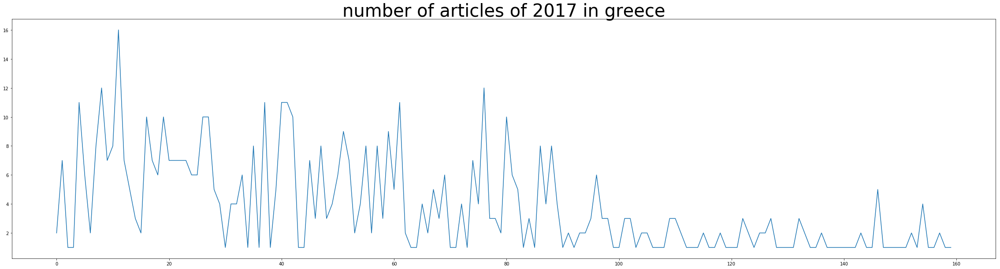

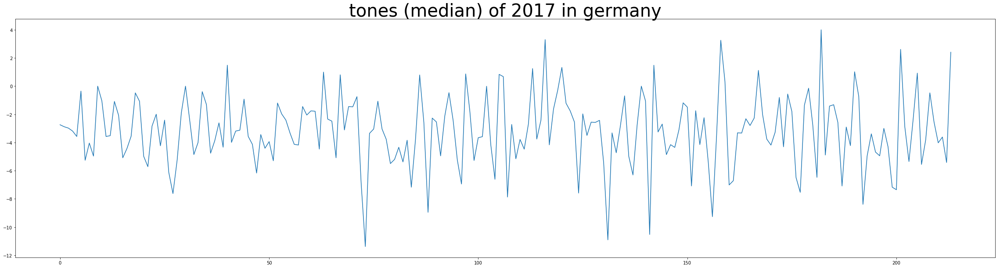

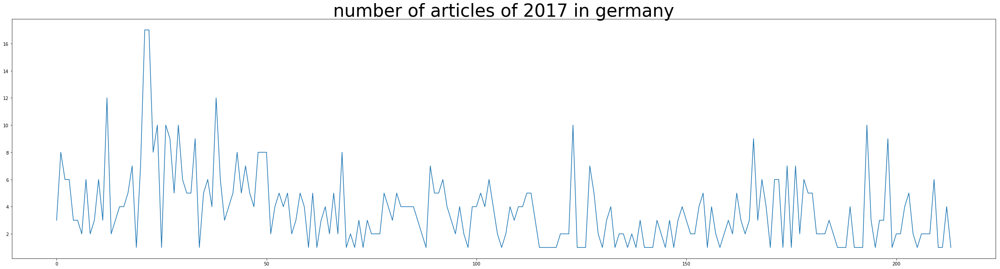

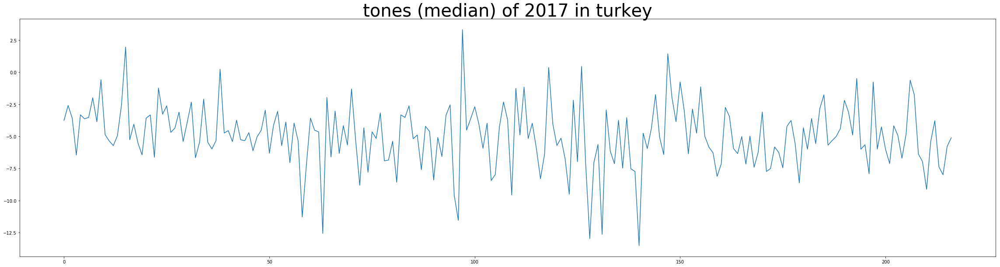

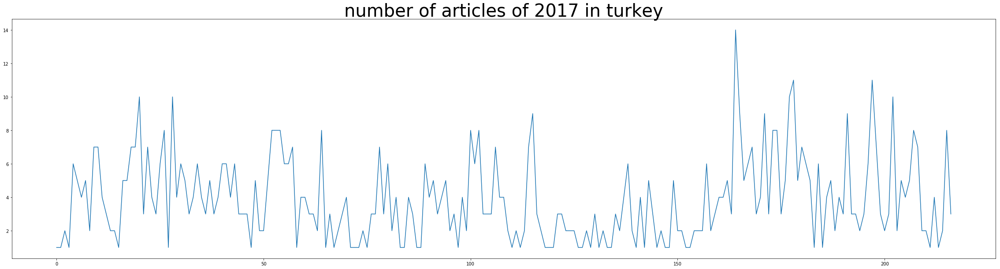

In [100]:
#tone 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_uk.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2017 in UK',fontsize=40)
#counts 2016
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_uk.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2017 in UK',fontsize=40)


#tone 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_greece.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2017 in greece',fontsize=40)
#counts 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_greece.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2017 in greece',fontsize=40)

#tone 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_germany.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2017 in germany',fontsize=40)
#counts 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_germany.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2017 in germany',fontsize=40)


#tone 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_turkey.groupby('DATE')['Tone'].median().values)
plt.title('tones (median) of 2017 in turkey',fontsize=40)
#counts 2017
plt.figure(figsize=(40,10))
plt.plot(V2Tone_eu_2017_turkey.groupby('DATE')['Tone'].count().values)
plt.title('number of articles of 2017 in turkey',fontsize=40)

# affiliated analysis for events table

In [101]:
refugees = spark.read.parquet('european_refugees.parquet')

In [102]:
country_codes = [
    'AU', 'AL', 'RS', 'BO', 'BE','BU',
    'HR','CY','EZ','DA','EN','FI','FR','GM',
    'GR','HU','EI','IT','LG','LH','LU','MT','NL','PL','PO',
    'RO','LO', 'SI','SP','SW','UK','NO','LS','IC','SZ','TU',
    'BK', 'RI,KV', 'MK', 'UP'
]

In [103]:
good_columns = [
"Year_Date",
"GLOBALEVENTID",
"Day_DATE",
"Actor1Code",
"Actor1Name",
"Actor1CountryCode",
"Actor1KnownGroupCode",
"Actor1EthnicCode",
"Actor1Religion1Code",
"Actor1Religion2Code",
"Actor2Code",
"Actor2Name",
"Actor2CountryCode",
"Actor2KnownGroupCode",
"Actor2EthnicCode",
"Actor2Religion1Code",
"Actor2Religion2Code",
"QuadClass",
"GoldsteinScale",
"NumMentions",
"NumArticles",
"AvgTone",
"Actor1Geo_CountryCode",
"Actor1Geo_Lat",
"Actor1Geo_Long",
"Actor2Geo_CountryCode",
"Actor2Geo_Lat",
"Actor2Geo_Long",
"ActionGeo_CountryCode",
"ActionGeo_Lat",
"ActionGeo_Long",
"SOURCEURL",
]

In [104]:
european_refugees = refugees.where(col('ActionGeo_CountryCode').isin(country_codes)).select(good_columns)

In [105]:
#get the AvgTone, country, date columns
tones_pd=european_refugees.select('AvgTone','ActionGeo_CountryCode','Day_DATE').toPandas()
tones_pd['Day_DATE']=tones_pd['Day_DATE'].astype('float')
tones_pd['AvgTone']=tones_pd['AvgTone'].astype('float')

#seperate the tones with the year 2015, 2016, 2017
Tones_2015=tones_pd[tones_pd.Day_DATE<20160000]
Tones_2016=tones_pd[(tones_pd.Day_DATE>20160000) & (tones_pd.Day_DATE<20170000)]
Tones_2017=tones_pd[(tones_pd.Day_DATE>20170000) & (tones_pd.Day_DATE<20180000)]

In [106]:
#the function was used to compute gini coefficient
def gini(array):
    """Calculate the Gini coefficient of a numpy array."""
    # based on bottom eq:
    # http://www.statsdirect.com/help/generatedimages/equations/equation154.svg
    # from:
    # http://www.statsdirect.com/help/default.htm#nonparametric_methods/gini.htm
    # All values are treated equally, arrays must be 1d:
    array = array.flatten()
    if np.amin(array) < 0:
        # Values cannot be negative:
        array -= np.amin(array)
    # Values cannot be 0:
    array += 0.0000001
    # Values must be sorted:
    array = np.sort(array)
    # Index per array element:
    index = np.arange(1,array.shape[0]+1)
    # Number of array elements:
    n = array.shape[0]
    # Gini coefficient:
    return ((np.sum((2 * index - n  - 1) * array)) / (n * np.sum(array)))

In [107]:
gini_2015_gini=Tones_2015.groupby('ActionGeo_CountryCode')['AvgTone'].apply(lambda x: gini(x.values))
gini_2016_gini=Tones_2016.groupby('ActionGeo_CountryCode')['AvgTone'].apply(lambda x: gini(x.values))
gini_2017_gini=Tones_2017.groupby('ActionGeo_CountryCode')['AvgTone'].apply(lambda x: gini(x.values))

In [108]:
gini_2015_tones=Tones_2015.groupby('ActionGeo_CountryCode')['AvgTone'].median()
gini_2016_tones=Tones_2016.groupby('ActionGeo_CountryCode')['AvgTone'].median()
gini_2017_tones=Tones_2017.groupby('ActionGeo_CountryCode')['AvgTone'].median()

In [110]:
#add the ISO
fips_to_country = pd.read_csv('country-codes.csv')
fips_to_country=fips_to_country.loc[:,['FIPS','ISO3166-1-Alpha-3','CLDR display name']]
fips_to_country.columns=['ActionGeo_CountryCode','ISO','name']

Gini_2015=pd.DataFrame([gini_2015_gini.index,gini_2015_gini.values,gini_2015_tones.values]).T
Gini_2015.columns=['ActionGeo_CountryCode','gini','tones']
Gini_2015 =  Gini_2015.merge(fips_to_country, how = 'left', on='ActionGeo_CountryCode')

Gini_2016=pd.DataFrame([gini_2016_gini.index,gini_2016_gini.values,gini_2016_tones.values]).T
Gini_2016.columns=['ActionGeo_CountryCode','gini','tones']
Gini_2016 =  Gini_2016.merge(fips_to_country, how = 'left', on='ActionGeo_CountryCode')

Gini_2017=pd.DataFrame([gini_2017_gini.index,gini_2017_gini.values,gini_2017_tones.values]).T
Gini_2017.columns=['ActionGeo_CountryCode','gini','tones']
Gini_2017 =  Gini_2017.merge(fips_to_country, how = 'left', on='ActionGeo_CountryCode')


In [111]:


data = []

year_set=[Gini_2015,Gini_2016,Gini_2017]
# let's create some additional, random data
for i in range(len(year_set)):
    year_data = year_set[i]
    data.append(dict(type='choropleth',
             locations = year_data['name'].astype(str),
             z=year_data['gini'].astype(float),
             locationmode='country names'))
    
# let's create the steps for the slider
steps = []
for i in range(len(data)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data)],
                label='Year {}'.format(i + 2015))
    step['args'][1][i] = True
    steps.append(step)

sliders = [dict(active=0,
                pad={"t": 1},
                steps=steps)]    
layout = dict(geo=dict(scope='europe', projection ={'type':'eckert4'}),
              sliders=sliders)

fig = dict(data=data, 
           layout=layout)
plotly.offline.iplot(fig)

this is the map for the distribution of gini coefficient in the year 2015, 2016, 2017.

R-square
0.40535389453961007


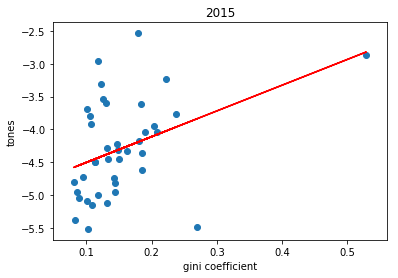

In [113]:
#Gini_2015.gini
from scipy.stats import *
#year 2015
plt.scatter(Gini_2015.gini,Gini_2015.tones)

slope, intercept, r_value, p_value, std_err = stats.linregress(Gini_2015.gini.astype(float),Gini_2015.tones.astype(float))
plt.plot(Gini_2015.gini.astype(float), intercept + slope*Gini_2015.gini.astype(float), 'r', label='fitted line')
plt.title('2015')
plt.xlabel('gini coefficient')
plt.ylabel('tones')
print('R-square')
print(r_value)

R-square
0.6292583668737077


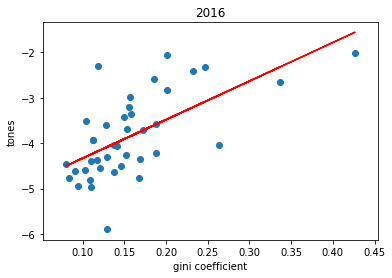

In [114]:
#year 2016
plt.scatter(Gini_2016.gini,Gini_2016.tones)


slope, intercept, r_value, p_value, std_err = stats.linregress(Gini_2016.gini.astype(float),Gini_2016.tones.astype(float))
plt.plot(Gini_2016.gini.astype(float), intercept + slope*Gini_2016.gini.astype(float), 'r', label='fitted line')
plt.title('2016')
plt.xlabel('gini coefficient')
plt.ylabel('tones')
print('R-square')
print(r_value)

R-square
-0.46847716945100953


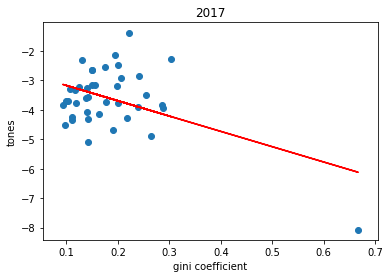

In [115]:
#year 2017
plt.scatter(Gini_2017.gini,Gini_2017.tones)

slope, intercept, r_value, p_value, std_err = stats.linregress(Gini_2017.gini.astype(float),Gini_2017.tones.astype(float))
plt.plot(Gini_2017.gini.astype(float), intercept + slope*Gini_2017.gini.astype(float), 'r', label='fitted line')
plt.title('2017')
plt.xlabel('gini coefficient')
plt.ylabel('tones')
print('R-square')
print(r_value)

from the correlation of gini coefficient andaverage tones, we could see in the year 2016, 2016, the R-square shows they have corrleation. However, in the year 2017, we didn't observe this corrleation.

In [123]:
clustering=pd.DataFrame([Gini_2016.tones,Gini_2017.tones]).T
clustering.columns=['tones_2016','tones_2017']

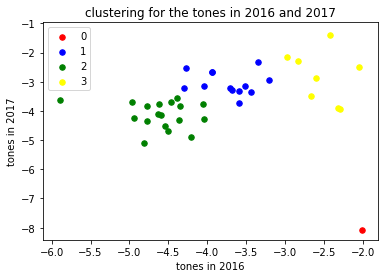

group 2
0         Albania
1         Austria
2         Belgium
5        Bulgaria
10        Czechia
12         France
13        Germany
14         Greece
15        Croatia
16        Hungary
18          Italy
24      Macedonia
28         Norway
31        Romania
33       Slovenia
35         Sweden
36    Switzerland
37         Turkey
Name: name, dtype: object
group 3
3         Bosnia
4        Belarus
9        Estonia
17       Iceland
19        Latvia
20     Lithuania
23    Luxembourg
30      Portugal
Name: name, dtype: object
group 1
6                    Cyprus
7                   Denmark
8                   Ireland
11                  Finland
21                 Slovakia
25                    Malta
26    Caribbean Netherlands
27              Netherlands
29                   Poland
32                   Russia
34                    Spain
38                       UK
39                  Ukraine
Name: name, dtype: object
group 0
22    Liechtenstein
Name: name, dtype: object


In [125]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=0).fit(clustering)
#V2Tone_eu_2016_countries['labels']=kmeans.labels_


#plt.scatter(V2Tone_eu_2016_countries.iloc[:,1].values,V2Tone_eu_2016_countries.loc[:,2].values)


#plot
scatter_x = np.array(clustering.iloc[:, 0])
scatter_y = np.array(clustering.iloc[:, 1])
group = kmeans.labels_
cdict = {0: 'red', 1: 'blue', 2: 'green',3:'yellow',4:'purple'}

fig, ax = plt.subplots()

for g in np.unique(group):
    ix = np.where(group == g)
    ax.scatter(scatter_x[ix], scatter_y[ix], c = cdict[g], label = g, s = 30)
ax.legend()
plt.title('clustering for the tones in 2016 and 2017')
plt.xlabel('tones in 2016')
plt.ylabel('tones in 2017')
plt.show()

print('group 2')
print(Gini_2016.name[group==2])

print('group 3')
print(Gini_2016.name[group==3])

print('group 1')
print(Gini_2016.name[group==1])

print('group 0')
print(Gini_2016.name[group==0])

We decide to do clustering analysis on the tones in 2016 and 2017.

The algothrim for clustering that we use is K-means.

From the results of clustering we could observe that:

group 2 always has negtive tones in those two years, they are the countries:
0         Albania
1         Austria
2         Belgium
5        Bulgaria
10        Czechia
12         France
13        Germany
14         Greece
15        Croatia
16        Hungary
18          Italy
24      Macedonia
28         Norway
31        Romania
33       Slovenia
35         Sweden
36    Switzerland
37         Turkey

group 3 always has relative less negtive tones in those two years, they are the countries:
group 3
3         Bosnia
4        Belarus
9        Estonia
17       Iceland
19        Latvia
20     Lithuania
23    Luxembourg
30      Portugal

group 1 always has relative middle tones in those two years, they are the countries:
6                    Cyprus
7                   Denmark
8                   Ireland
11                  Finland
21                 Slovakia
25                    Malta
26    Caribbean Netherlands
27              Netherlands
29                   Poland
32                   Russia
34                    Spain
38                       UK
39                  Ukraine

only group 0 has relative less negtive tones in 2016 while very negtive tones in 2017. it's the country: 22    Liechtenstein